In [4]:
import pandas as pd
import numpy as np
import scanpy as sc
import anndata as ad
import matplotlib.pyplot as plt
import matplotlib as mpl
from matplotlib.image import imread
import os
import sys



import warnings
warnings.filterwarnings("ignore")

os.environ["CUDA_VISIBLE_DEVICES"] = "0"

In [5]:
from STitch3D import *

In [6]:
# spatial transcriptomics data
count = pd.read_csv("/home/bhuaq/STitch3D/math5472/data/human_heart/data/Filtered/filtered_ST_matrix_and_meta_data/filtered_matrix.tsv",
                    sep="\t", index_col=0).T

meta = pd.read_csv("/home/bhuaq/STitch3D/math5472/data/human_heart/data/Filtered/filtered_ST_matrix_and_meta_data/meta_data.tsv",
                   sep="\t", index_col=0)

genes_new = pd.read_csv("/home/bhuaq/STitch3D/math5472/data/human_heart/genes_new.txt")
count.columns = list(genes_new.x.values)

count = count.loc[:, count.columns.notna()]

In [7]:
adata_st_list_raw = []

for i in range(1, 10):
    count_i = count[[loc.split("x")[0]==str(i+4) for loc in count.index]]
    count_i.index = [(loc.split("x")[1]+"x"+loc.split("x")[2]) for loc in count_i.index]
    meta_i = meta[[loc.split("x")[0]==str(i+4) for loc in meta.index]]
    meta_i.index = [(loc.split("x")[1]+"x"+loc.split("x")[2]) for loc in meta_i.index]

    loc_i = pd.read_csv("/home/bhuaq/STitch3D/math5472/data/human_heart/data/ST_Samples_6.5PCW/ST_Sample_6.5PCW_%d/spot_data-all-ST_Sample_6.5PCW_%d.tsv" % (i, i),
                       sep="\t")

    loc_i.index = [(str(loc_i.x.values[k]) + 'x' + str(loc_i.y.values[k])) for k in range(loc_i.shape[0])]
    loc_i = loc_i.loc[meta_i.index]

    img_i = imread('/home/bhuaq/STitch3D/math5472/data/human_heart/data/ST_Samples_6.5PCW/ST_Sample_6.5PCW_%d/ST_Sample_6.5PCW_%d_HE_small.jpg' % (i, i))

    adata_st_i = ad.AnnData(X = count_i.values)

    adata_st_i.obs = meta_i
    adata_st_i.obs['selected'] = loc_i['selected'].values
    adata_st_i.var.index = count_i.columns

    library_id = '0'
    adata_st_i.uns["spatial"] = dict()
    adata_st_i.uns["spatial"]['0'] = dict()
    adata_st_i.uns["spatial"]['0']['images'] = dict()
    adata_st_i.uns["spatial"]['0']['images']['hires'] = img_i
    adata_st_i.uns["spatial"]['0']['scalefactors'] = {'spot_diameter_fullres': 100,
                                                      'tissue_hires_scalef': 1.0,
                                                      'fiducial_diameter_fullres': 100,
                                                      'tissue_lowres_scalef': 1.0}

    adata_st_i.obsm['spatial'] = np.concatenate((loc_i['pixel_x'].values.reshape(-1, 1),
                                                 loc_i['pixel_y'].values.reshape(-1, 1)), axis=1)

    adata_st_i.obsm['loc_use'] = np.concatenate((loc_i['x'].values.reshape(-1, 1),
                                                 loc_i['y'].values.reshape(-1, 1)), axis=1)

    adata_st_i.obs['array_row'] = loc_i['y'].values
    adata_st_i.obs['array_col'] = loc_i['x'].values

    adata_st_i = adata_st_i[adata_st_i.obs['selected'].values != 0]
    adata_st_list_raw.append(adata_st_i.copy())

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [8]:
count_ref = pd.read_csv("/home/bhuaq/STitch3D/math5472/data/human_heart/data/Filtered/share_files/all_cells_count_matrix_filtered.tsv",
                        sep='\t', index_col=0).T

meta_ref = pd.read_csv("/home/bhuaq/STitch3D/math5472/data/human_heart/data/Filtered/share_files/all_cells_meta_data_filtered.tsv",
                        sep='\t', index_col=0)

adata_ref = ad.AnnData(X = count_ref.values)
adata_ref.obs.index = count_ref.index
adata_ref.var.index = count_ref.columns
for col in meta_ref.columns[:-1]:
    adata_ref.obs[col] = meta_ref.loc[count_ref.index][col].values

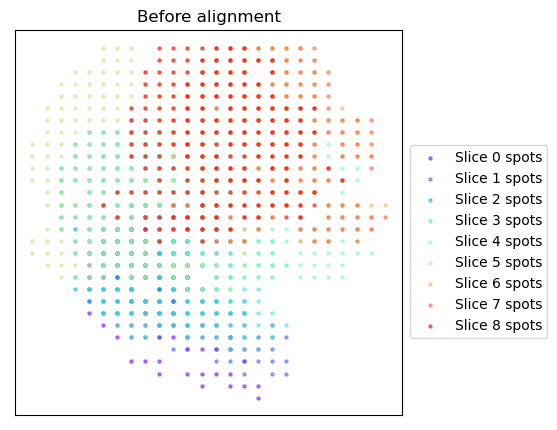

Using the Iterative Closest Point algorithm for alignemnt.
Detecting edges...
Aligning edges...


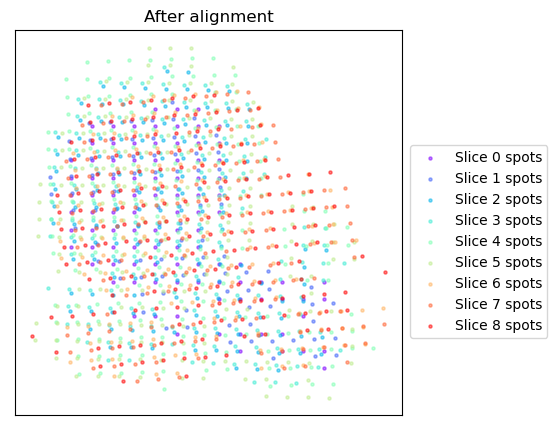

In [9]:
adata_st_list = STitch3D.utils.align_spots(adata_st_list_raw, data_type = "ST", coor_key="loc_use", test_all_angles=True, plot=True)

In [10]:
adata_st, adata_basis = STitch3D.utils.preprocess(adata_st_list,
                                                  adata_ref,
                                                  sample_col="experiment",
                                                  rad_cutoff=1.1, c2c_dist=200., coor_key="loc_use",
                                                  slice_dist_micron=[5., 115., 85., 160.,
                                                                     5., 160., 5., 155.,],
                                                  n_hvg_group=500)


Finding highly variable genes...


Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Trying to set attribute `.obs` of view, copying.
Variable names are not uniq

3837 highly variable genes selected.
Calculate basis for deconvolution...
2 batches are used for computing the basis vector of cell type <Atrial cardiomyocytes>.
2 batches are used for computing the basis vector of cell type <Capillary endothelium>.
2 batches are used for computing the basis vector of cell type <Cardiac neural crest cells >.
2 batches are used for computing the basis vector of cell type <Endothelium / pericytes >.
2 batches are used for computing the basis vector of cell type <Epicardial cells>.
2 batches are used for computing the basis vector of cell type <Epicardium-derived cells>.
2 batches are used for computing the basis vector of cell type <Erythrocytes>.
2 batches are used for computing the basis vector of cell type <Fibroblast-like >.
1 batches are used for computing the basis vector of cell type <Immune cells>.
2 batches are used for computing the basis vector of cell type <Myoz2-enriched cardiomyocytes>.
1 batches are used for computing the basis vector of c

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


Start building a graph...
Radius for graph connection is 1.1000.
9.4365 neighbors per cell on average.


In [11]:
model = STitch3D.model.Model(adata_st, adata_basis)

model.train()

  0%|          | 10/20000 [00:00<15:01, 22.18it/s] 

Step: 0, Loss: 168.2984, d_loss: 162.5888, f_loss: 57.0959


 10%|█         | 2018/20000 [00:23<03:22, 88.93it/s]

Step: 2000, Loss: -1038.1134, d_loss: -1041.2239, f_loss: 31.1042


 20%|██        | 4016/20000 [00:45<02:59, 88.96it/s]

Step: 4000, Loss: -1058.1724, d_loss: -1061.0372, f_loss: 28.6483


 30%|███       | 6014/20000 [01:08<02:37, 88.82it/s]

Step: 6000, Loss: -1059.5598, d_loss: -1062.2771, f_loss: 27.1723


 40%|████      | 8012/20000 [01:30<02:15, 88.64it/s]

Step: 8000, Loss: -1060.4999, d_loss: -1063.1768, f_loss: 26.7684


 50%|█████     | 10010/20000 [01:53<01:52, 88.73it/s]

Step: 10000, Loss: -1061.8901, d_loss: -1064.4360, f_loss: 25.4589


 60%|██████    | 12017/20000 [02:16<01:30, 88.61it/s]

Step: 12000, Loss: -1062.2078, d_loss: -1064.7231, f_loss: 25.1538


 70%|███████   | 14015/20000 [02:38<01:07, 89.08it/s]

Step: 14000, Loss: -1062.4539, d_loss: -1064.9465, f_loss: 24.9268


 80%|████████  | 16013/20000 [03:01<00:45, 86.90it/s]

Step: 16000, Loss: -1062.7759, d_loss: -1065.2605, f_loss: 24.8458


 90%|█████████ | 18011/20000 [03:24<00:23, 86.45it/s]

Step: 18000, Loss: -1063.0516, d_loss: -1065.5007, f_loss: 24.4910


100%|██████████| 20000/20000 [03:46<00:00, 88.31it/s]


In [12]:
save_path = "/home/bhuaq/STitch3D/math5472/results_sitich3D/human_heart"

result = model.eval(adata_st_list_raw, save=True, output_path=save_path)

... storing 'Sample' as categorical
... storing 'ChipBatch' as categorical
... storing 'ChipNr' as categorical
... storing 'Experiment_procedure' as categorical
... storing 'Sample' as categorical
... storing 'ChipBatch' as categorical
... storing 'ChipNr' as categorical
... storing 'Experiment_procedure' as categorical
... storing 'Sample' as categorical
... storing 'ChipBatch' as categorical
... storing 'ChipNr' as categorical
... storing 'Experiment_procedure' as categorical
... storing 'Sample' as categorical
... storing 'ChipBatch' as categorical
... storing 'ChipNr' as categorical
... storing 'Experiment_procedure' as categorical
... storing 'Sample' as categorical
... storing 'ChipBatch' as categorical
... storing 'ChipNr' as categorical
... storing 'Experiment_procedure' as categorical
... storing 'Sample' as categorical
... storing 'ChipBatch' as categorical
... storing 'ChipNr' as categorical
... storing 'Experiment_procedure' as categorical
... storing 'Sample' as categorica

Slice 1


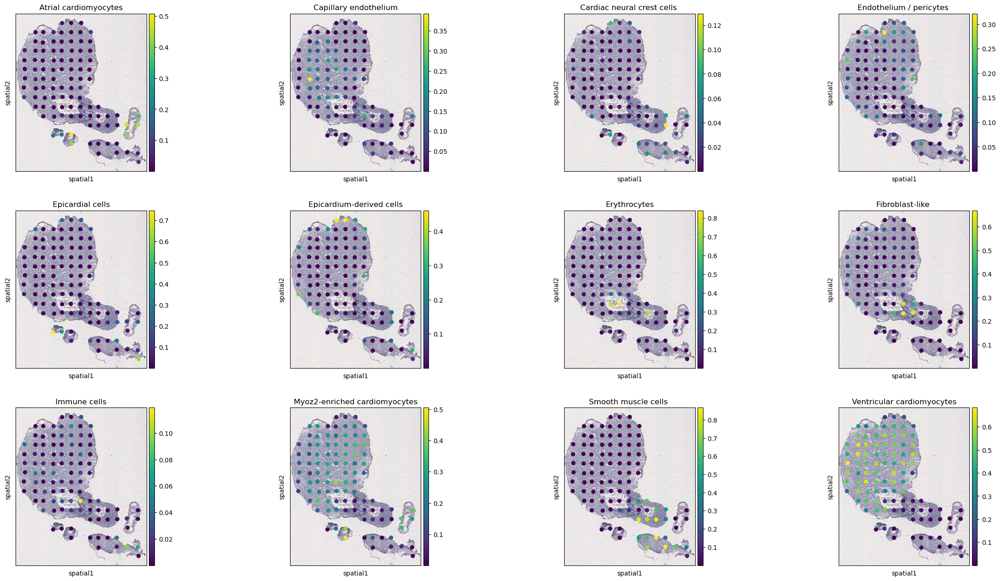

Slice 2


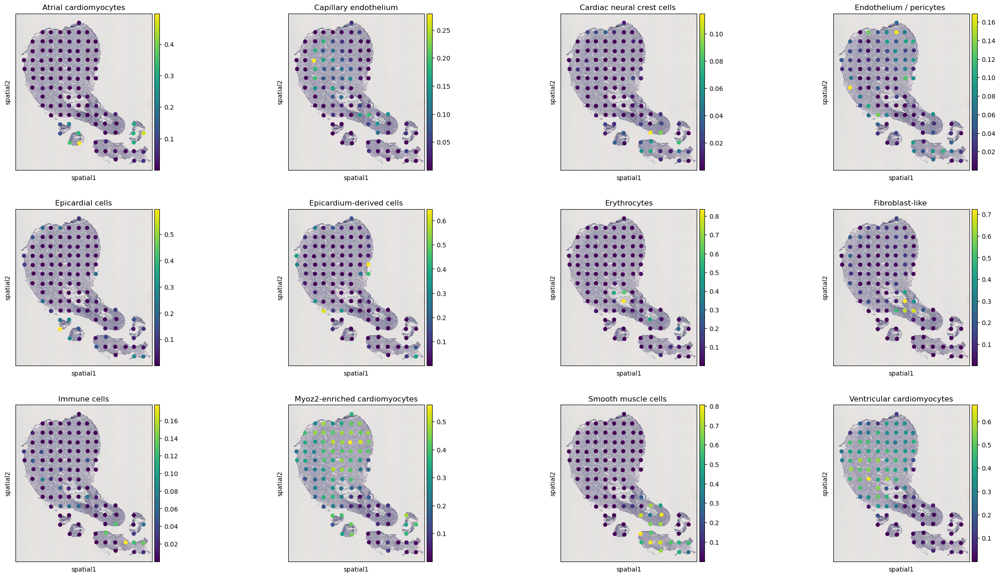

Slice 3


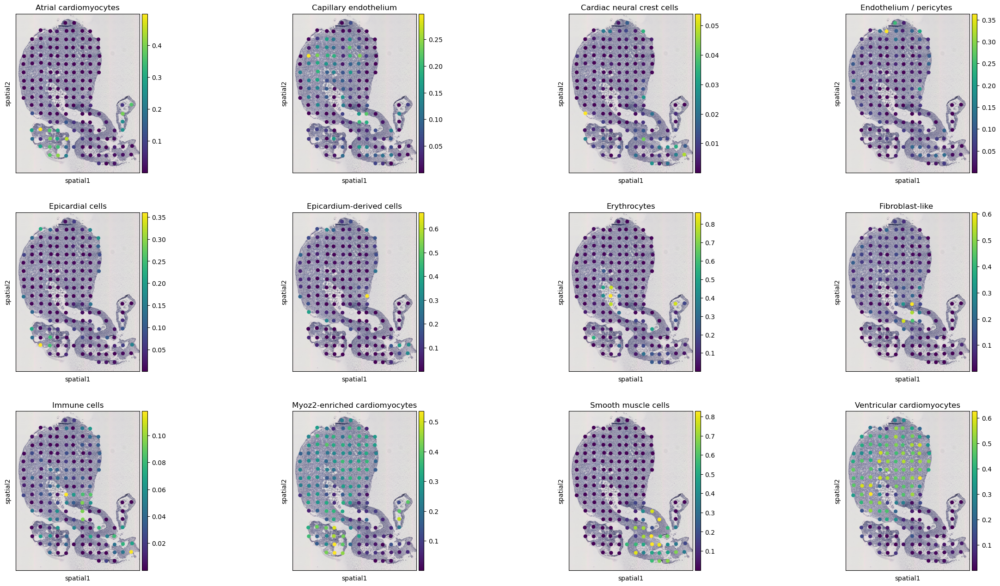

Slice 4


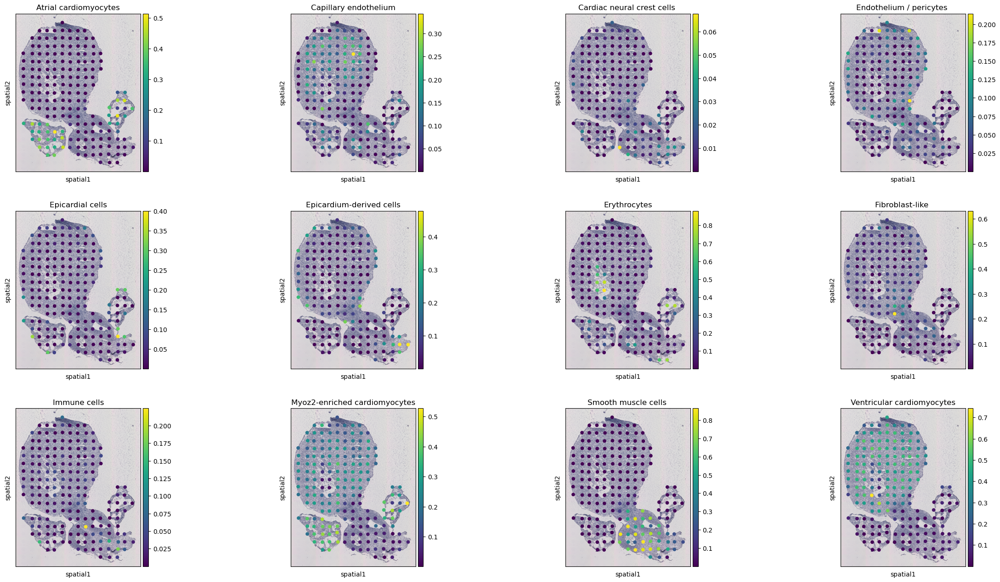

Slice 5


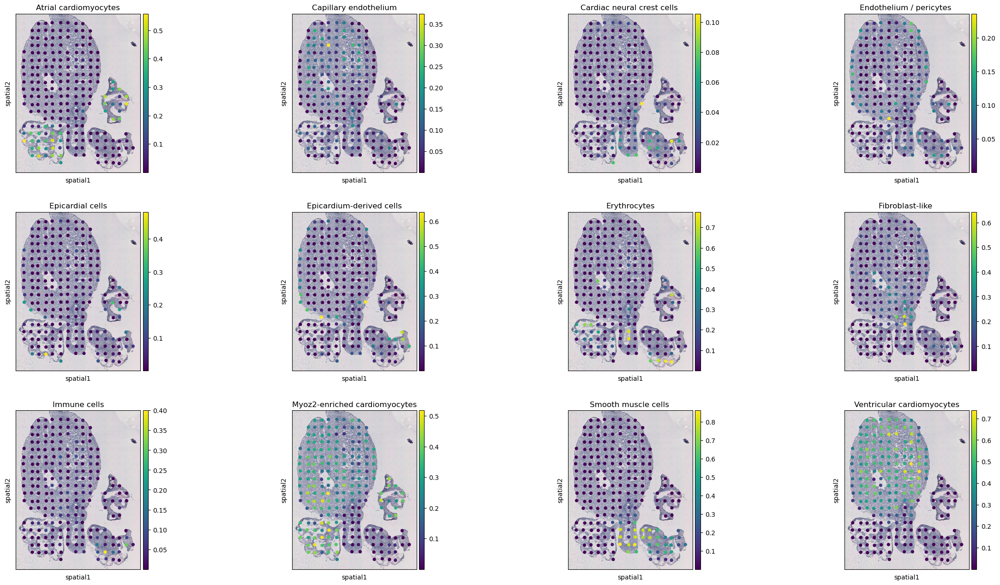

Slice 6


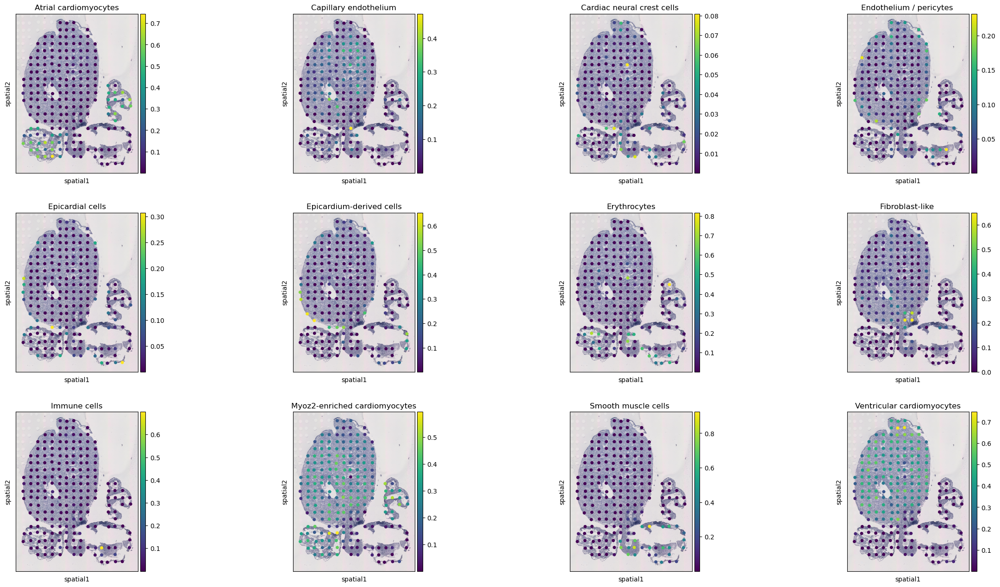

Slice 7


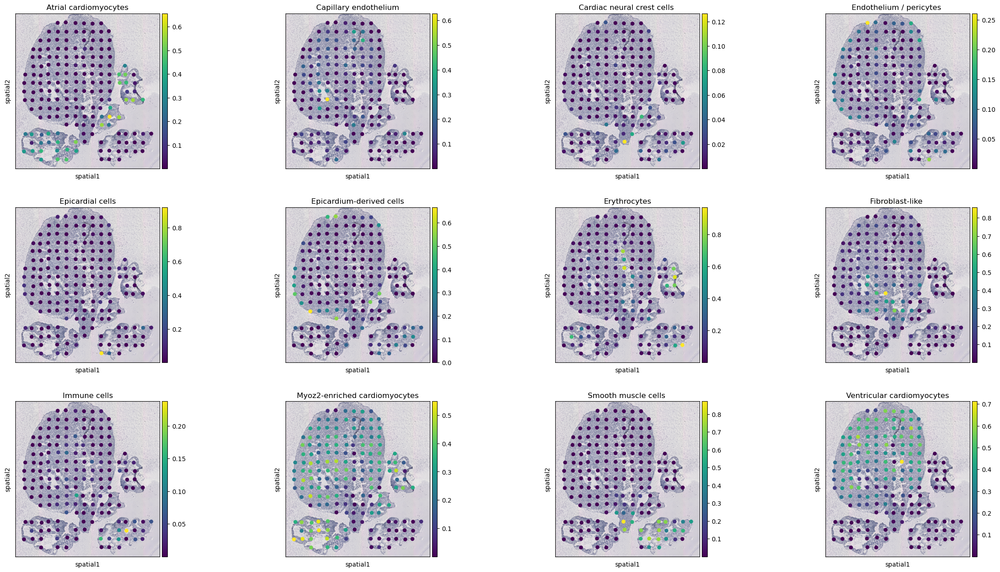

Slice 8


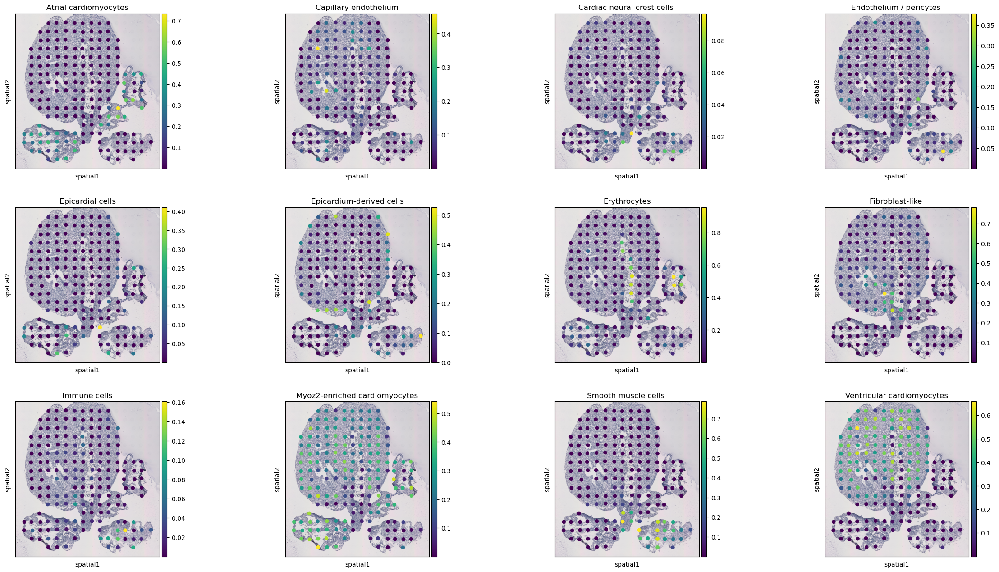

Slice 9


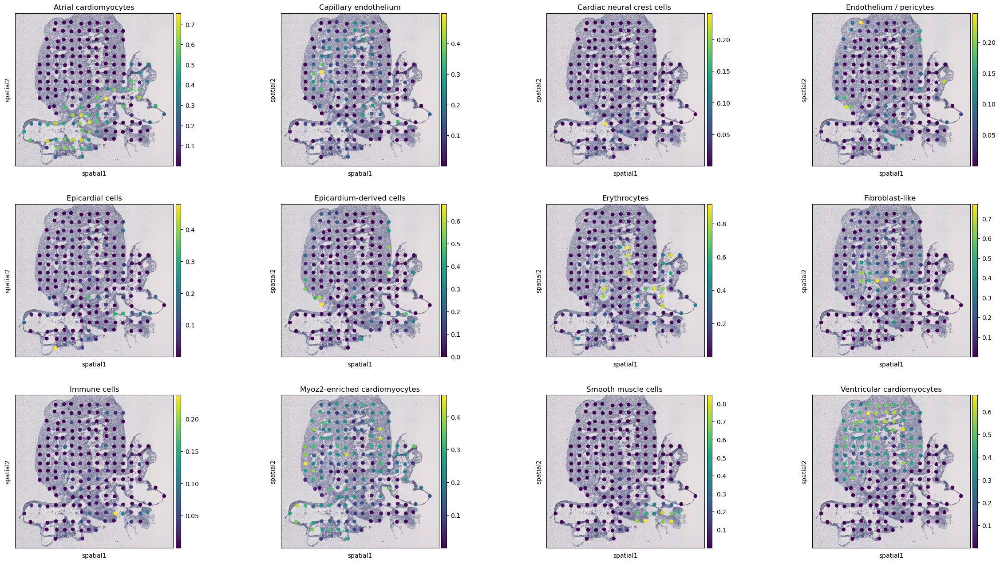

In [14]:
for i, adata_st_i in enumerate(result):
    print("Slice %d" % (i+1))
    sc.pl.spatial(adata_st_i, img_key="hires", color=model.celltypes, size=1.)

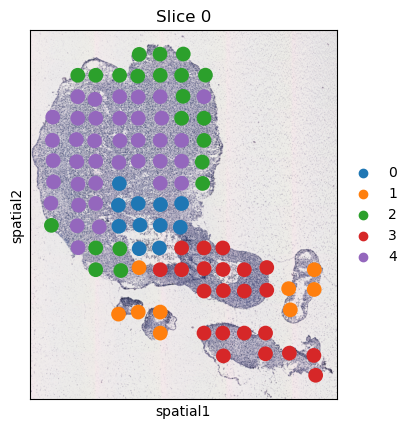

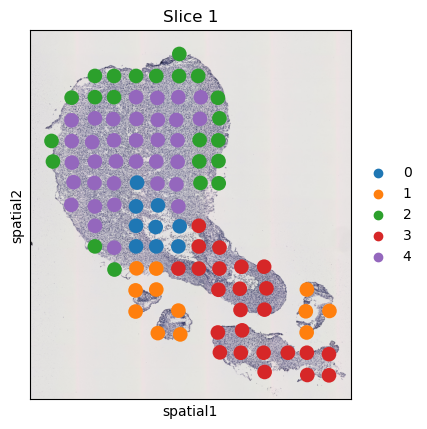

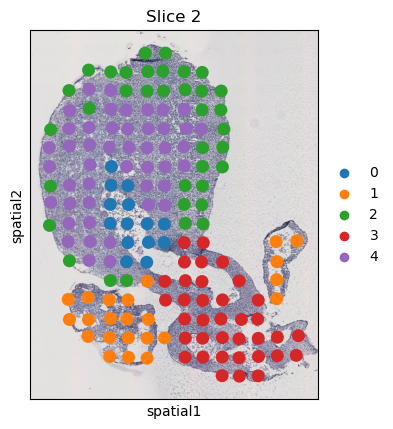

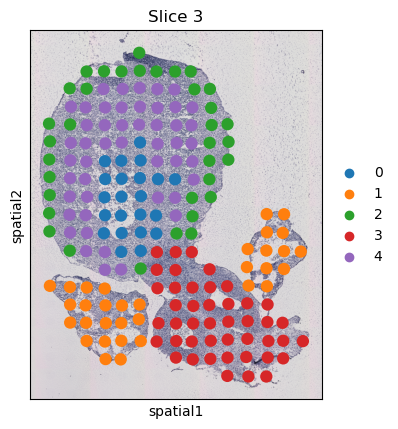

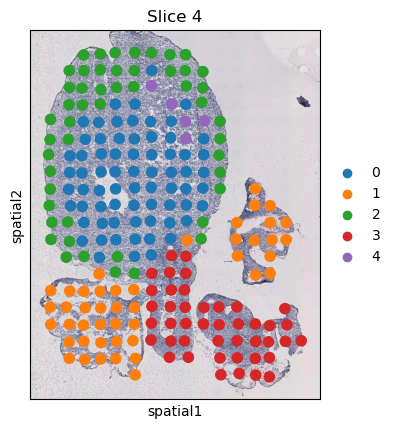

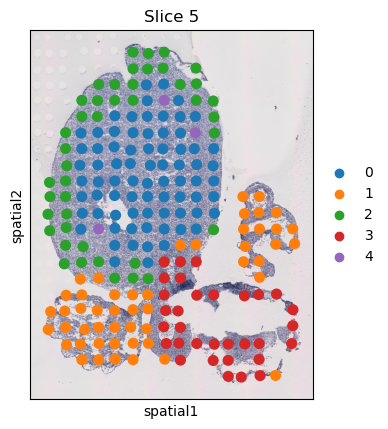

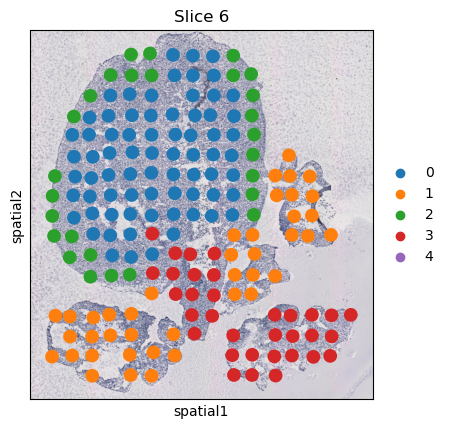

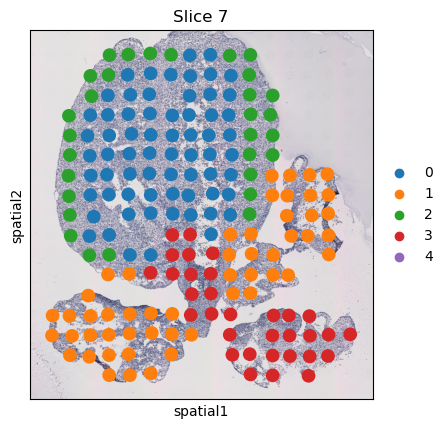

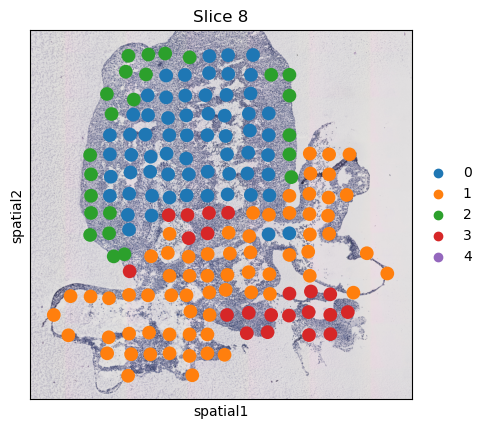

In [16]:
for i, adata_st_i in enumerate(result):
    sc.pl.spatial(result[i], img_key="hires", color=["louvain"], size=1.5, title="Slice %d" % (i),)